# Watershed challenge

### Important points to take into account:

This challenge shouldn't take more than 5 hours, so we don't expect perfect answers.
The difficulty will grow, so try to answer as much as you can (it is not mandatory to complete the whole challenge).

We will only accept Jupyter notebook/lab files and they need to run!

# Motivation

**Note**: the following paragraph is only for understanding the problem and why it is relevant. It is not necessary to fully understand the background, the challenge itself will guide you. So read fast this information and follow with the challenge.

The heat waves are extreme meteorological events (extreme temperatures) which can impact negatively in our ecosystem. This situation can have multiple impacts; from very hot summer days and wildfires, to floods and alluviums. As the heat waves depend on atmospheric circulation phenomenas, which can be detected few days in advance, there is a big opportunity for trying to predict the occurrence of the negative impacts associated with it. This is key in the context of global warming, where the frequency of this events have grown in the last century (https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2012GL053361). We can explore the opportunity of predicting heat waves, in particular the peak-flows events, using a Chilean monitoring network of hydro meteorological variables.Thanks to public institutions such as DGA and CR2, we have data from different stations, some of which measure temperature and precipitations, and others measuring the total volume of water that a hydrographic watershed contribute to a section of river. 

Some of the key questions we could try to answer are:

- Has the frequency of heat waves events increased over the last years? 
- Is there any relationship between heat waves and peak flow events?
- If so, can we correlate those events with the watershed's features?

# Instructions

As we discussed above, we will try to predict extreme watershed events in Chile. For this we count with a public and real dataset from meteorological stations.
Each row represents the measure of daily flux in a specific station. This measure will be associated with watershed's features (fixed) and daily temperature and precipitation measures of nearby stations.

The file flux.csv contains all the data used for this challenge. This database was produced by us and synthesizes flux, temperature and precipitation data.

**Note about the database**: the stations which measure flux and the stations that measure temperature and precipitation are not located at the same place. For building this database, we took the watershed's upstream polygon and find the temperature and precipitation stations inside this polygon, and we calculated the average over that variables. In this way, every flux measure will be accompanied of a unique temperature and precipitation measure.

The database contains the following variables between others:

- station_code: station code
- station_name: name of the watershed
- date: date of measurement
- flux: water flux for that day
- avg_precip: average precipitation for that day in that watershed
- avg_max_temp: maximum average temperature for that day in that watershed

## Challenge

1. Download the file `flux.csv` from github (compressed as `flux.csv.zip`).
2. Perform an EDA over `flux.csv` file.
3. Plot flux, temperature and precipitations:
    - a) Write a function that plot a time series of a specific variable (flux, temp, precip) from a station. Should look like this:
        ```python
        def plot_one_timeserie(cod_station, variable, min_date, max_date):
        ```
        
    - b) Now write a function that plots the 3 variables at the same time. As the variables are in different scales, you can normalize before plotting them. Should look like this:
        ```python
        def plot_three_timeseries(cod_station, min_date, max_date):
        ```   
4. Create three variables called:
    - `flux_extreme`
    - `temp_extreme`
    - `precip_extreme`
    
    This variables should take the value of 1 when that variable in a specific day was extreme. Being extreme could be considered as being greater than expected. For example, a flux can be considered as extreme (value 1) when is over the 95 percentile of the flux distribution for that specific season, and takes the value 0 otherwise. Taking into account the seasonality of that variables is very important, because $25^\circ C$ could be considered as extreme in wintertime, but it’d be a normal temperature for summertime.
    
    Do you consider this a good way of capturing extreme events? Or you would have used a different method? Which one?
    
5. Plot the variable `flux_extreme`. Are there any different behaviours among different watersheds?
6. Plot the percentage of extreme events during time. Have they become more frequent?
7. Extreme flux prediction. Train one or many models (using your preferred algorithms) for estimating the probability of having an extreme flux. Feel free to create new features or use external variables. Some of the discussion we would like to see: Which data can be used and which cannot? Of course, we cannot use future data, but what about data from the same day? Or from the previous day?  
    
    Everything depends on how you propose the model use. Make a proposal on how you would use the model in practice (for example, once trained, the model will predict next day probability). Depending on your proposal, set constraints about which variables you can or cannot use.
    
8. Analyze the model results.
    - a) What is the performance of the model? Which metrics you consider are the best suited for this problem? What are the most important variables? What do you think about the results?
    - b) If we wanted to identify at least 70% of the extreme flux events, which are the metrics of your model for that threshold? It is a useful model?
9. Upload your work to a public repository (MIT licence desired) and send the link to us:
    - **To**: mariapaz.salvatierra@bain.com 
    - **Cc**: aline.andrade@bain.com
    - **Subject**: “Watershed Challenge”

# 1

In [3]:
# We import the necessary libraries

import pandas as pd
import numpy as np
import seaborn as sns
import datetime
import requests
import plotly.express as px

# Library that creates a report of the dataframe
import pandas_profiling as pp

# We have to add that command after importing matplotlib
# otherwise, plots are not shown

import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
# We create a dataframe from the csv file
# since there is a field with dates, we need to parse it

df_flux = pd.read_csv('flux.csv', parse_dates=['date'])
df_flux.head(-10)

,date,basin_id,flux,precip,temp_max,gauge_name,lat,lon,mean_elev,area_km2
0,1980-01-01,1001001,0.579,0.0,10.685653,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
1,1980-01-02,1001001,0.543,0.0,11.470960,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
2,1980-01-03,1001001,0.482,0.0,11.947457,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
3,1980-01-04,1001001,0.459,0.0,12.424489,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
4,1980-01-05,1001001,0.436,0.0,12.649203,Rio Caquena En Nacimiento,-18.0769,-69.1961,4842.449328,49.711859
...,...,...,...,...,...,...,...,...,...,...
4180465,2020-05-23,12930001,0.390,NaN,NaN,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617
4180466,2020-05-24,12930001,0.386,NaN,NaN,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617
4180467,2020-05-25,12930001,0.386,NaN,NaN,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617
4180468,2020-05-26,12930001,0.498,NaN,NaN,Rio Robalo En Puerto Williams,-54.9469,-67.6392,520.849289,20.645617


# 2

In [5]:
df_flux.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4180480 entries, 0 to 4180479
Data columns (total 10 columns):
 #   Column      Dtype         
---  ------      -----         
 0   date        datetime64[ns]
 1   basin_id    int64         
 2   flux        float64       
 3   precip      float64       
 4   temp_max    float64       
 5   gauge_name  object        
 6   lat         float64       
 7   lon         float64       
 8   mean_elev   float64       
 9   area_km2    float64       
dtypes: datetime64[ns](1), float64(7), int64(1), object(1)
memory usage: 318.9+ MB


In [6]:
# We generate an HTML report of the dataframe

from pandas_profiling import ProfileReport
#Solo utilizamos los primeros 10000 datos
#prof = ProfileReport(df_train.sample(n=10000)) 
#prof.to_file(output_file='train_report.html')
ProfileReport(df_flux.sample(n=10000))

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Fascinating

From the report we see some interesting things:

* First of all there are 4.180.480 entries, starting January 1st 1980 the earliest and May 27th 2020 the latest.

* Secondly, there are the same number of distinct values of basin_id and gauge_name (493) so we can safely assume the gauge_name corresponds 1 to 1 to the basin_id, therefore, we can drop the name and work with the id only.

* Thirdly, we see that we have some missing values in precip and temp_max (17). Let's see if they are in the same rows.  



In [7]:
df_flux[df_flux.isna().any(axis=1)].head(20)

,date,basin_id,flux,precip,temp_max,gauge_name,lat,lon,mean_elev,area_km2
60493,2020-05-06,1021001,1.707,NaN,NaN,Rio Lauca En Japu (O En El Limite),-18.5833,-69.0467,4493.855498,3277.980908
60494,2020-05-07,1021001,1.687,NaN,NaN,Rio Lauca En Japu (O En El Limite),-18.5833,-69.0467,4493.855498,3277.980908
60495,2020-05-08,1021001,1.698,NaN,NaN,Rio Lauca En Japu (O En El Limite),-18.5833,-69.0467,4493.855498,3277.980908
60496,2020-05-09,1021001,1.694,NaN,NaN,Rio Lauca En Japu (O En El Limite),-18.5833,-69.0467,4493.855498,3277.980908
60497,2020-05-10,1021001,1.690,NaN,NaN,Rio Lauca En Japu (O En El Limite),-18.5833,-69.0467,4493.855498,3277.980908
60498,2020-05-11,1021001,1.644,NaN,NaN,Rio Lauca En Japu (O En El Limite),-18.5833,-69.0467,4493.855498,3277.980908
60499,2020-05-12,1021001,1.622,NaN,NaN,Rio Lauca En Japu (O En El Limite),-18.5833,-69.0467,4493.855498,3277.980908
60500,2020-05-13,1021001,1.624,NaN,NaN,Rio Lauca En Japu (O En El Limite),-18.5833,-69.0467,4493.855498,3277.980908
60501,2020-05-14,1021001,1.622,NaN,NaN,Rio Lauca En Japu (O En El Limite),-18.5833,-69.0467,4493.855498,3277.980908
60502,2020-05-15,1021001,1.606,NaN,NaN,Rio Lauca En Japu (O En El Limite),-18.5833,-69.0467,4493.855498,3277.980908


We see that the NaN values are all from 1 basin_id and they are consecutive (around the same days). This is probably from a malfunction of the precipitations and temperature sensors between May 6th and May 25th 2020. We can drop these values without affecting the statistics much (there are more than 4 million entries), unless we want some specific location and time stats from this particular region/place (extreme north of Chile, near the Bolivian border). 

In [8]:
df_flux = df_flux.dropna()

In [9]:
# We extract unique latitude and longitude pairs

pd.set_option('display.max_rows', 500)
df_latlon = df_flux.groupby(['lat','lon']).size().reset_index().rename(columns={0:'count'})
df_latlon.sort_values(by=['count'], ascending=False).head(500)

,lat,lon,count
40,-51.0167,-72.4833,26808
73,-44.7500,-72.7167,14656
344,-32.8503,-70.5094,14638
126,-39.5500,-72.9000,14617
366,-31.9667,-70.5944,14607
412,-29.9953,-70.5867,14602
145,-38.6867,-72.5028,14571
148,-38.6081,-72.8478,14505
147,-38.6167,-72.4167,14469
329,-33.3703,-70.4508,14423


In [10]:
df_latlon.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   lat     500 non-null    float64
 1   lon     500 non-null    float64
 2   count   500 non-null    int64  
dtypes: float64(2), int64(1)
memory usage: 11.8 KB


In [11]:
df_basinid_count = df_flux.groupby(['basin_id']).size().reset_index().rename(columns={0:'count'})
df_basinid_count.sort_values(by=['count'], ascending=False).head(500)

,basin_id,count
150,5410002,14638
380,10134001,14617
120,4703002,14607
88,4320001,14602
354,9129002,14571
349,9116001,14505
353,9127001,14469
180,5722002,14423
87,4314002,14386
344,9106001,14354


In [12]:
df_basinid_count.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 503 entries, 0 to 502
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype
---  ------    --------------  -----
 0   basin_id  503 non-null    int64
 1   count     503 non-null    int64
dtypes: int64(2)
memory usage: 8.0 KB


# Oh-oh

There are 500 latitude/longitude pairs but 503 different station (basin) id's... something is strange. Doing some Sherlock Holmes investigating I found that basin_id=11143002 and basin_id=11147001 have the same latitude and longitude. Also, basin_id=12284002 and basin_id=12284003 share the same latitude and longitude. And basin_id=8821001 with basin_id=8821002 as well.  

In [13]:
# which latitude/longitude pairs do not have the same count as basin_ids. 

df_merged=df_basinid_count.merge(df_latlon, on=['count'], how='right', indicator='Match')
df_merged[df_merged['Match'] != 'both'].head()

,basin_id,count,lat,lon,Match
42,NaN,26808,-51.0167,-72.4833,right_only
77,NaN,14656,-44.7500,-72.7167,right_only
181,NaN,12488,-37.8167,-73.2500,right_only


In [14]:
# which longitude has associated two different basin_ids

df_flux[(df_flux['lon'] == -73.2500) & (df_flux['basin_id'] != 8821001)].head()

,date,basin_id,flux,precip,temp_max,gauge_name,lat,lon,mean_elev,area_km2
2798736,1980-01-01,8821002,6.19,0.0,21.389920,Rio Butamalal En Butamalal,-37.8167,-73.25,778.876647,123.114752
2798737,1980-01-02,8821002,6.03,0.0,19.773588,Rio Butamalal En Butamalal,-37.8167,-73.25,778.876647,123.114752
2798738,1980-01-03,8821002,4.71,0.0,21.788522,Rio Butamalal En Butamalal,-37.8167,-73.25,778.876647,123.114752
2798739,1980-01-04,8821002,3.86,0.0,22.803998,Rio Butamalal En Butamalal,-37.8167,-73.25,778.876647,123.114752
2798740,1980-01-05,8821002,3.52,0.0,21.773046,Rio Butamalal En Butamalal,-37.8167,-73.25,778.876647,123.114752


In [15]:
df_flux[(df_flux['lon'] == -72.7167) & (df_flux['basin_id'] == 11143002) & (df_flux['basin_id'] != 11147001)].head()

,date,basin_id,flux,precip,temp_max,gauge_name,lat,lon,mean_elev,area_km2
3591041,1988-06-28,11143002,22.30,24.106907,4.941613,Rio Moro Antes Junta Rio Cisnes,-44.75,-72.7167,1186.603488,133.900176
3591042,1988-06-29,11143002,12.60,3.289621,2.238838,Rio Moro Antes Junta Rio Cisnes,-44.75,-72.7167,1186.603488,133.900176
3591043,1988-06-30,11143002,9.02,1.524570,1.349292,Rio Moro Antes Junta Rio Cisnes,-44.75,-72.7167,1186.603488,133.900176
3591044,1988-07-01,11143002,6.91,0.000000,-0.025477,Rio Moro Antes Junta Rio Cisnes,-44.75,-72.7167,1186.603488,133.900176
3591045,1988-07-02,11143002,5.79,0.000000,-1.976297,Rio Moro Antes Junta Rio Cisnes,-44.75,-72.7167,1186.603488,133.900176


In [16]:
# the number of entries equals to the count for the lat/lon pair

df_flux[(df_flux['basin_id'] == 12284002) | (df_flux['basin_id'] == 12284003)].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26808 entries, 3853844 to 3880651
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        26808 non-null  datetime64[ns]
 1   basin_id    26808 non-null  int64         
 2   flux        26808 non-null  float64       
 3   precip      26808 non-null  float64       
 4   temp_max    26808 non-null  float64       
 5   gauge_name  26808 non-null  object        
 6   lat         26808 non-null  float64       
 7   lon         26808 non-null  float64       
 8   mean_elev   26808 non-null  float64       
 9   area_km2    26808 non-null  float64       
dtypes: datetime64[ns](1), float64(7), int64(1), object(1)
memory usage: 2.2+ MB


In [17]:
df_flux[(df_flux['basin_id'] == 11143002) | (df_flux['basin_id'] == 11147001)].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14656 entries, 3591041 to 3605696
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        14656 non-null  datetime64[ns]
 1   basin_id    14656 non-null  int64         
 2   flux        14656 non-null  float64       
 3   precip      14656 non-null  float64       
 4   temp_max    14656 non-null  float64       
 5   gauge_name  14656 non-null  object        
 6   lat         14656 non-null  float64       
 7   lon         14656 non-null  float64       
 8   mean_elev   14656 non-null  float64       
 9   area_km2    14656 non-null  float64       
dtypes: datetime64[ns](1), float64(7), int64(1), object(1)
memory usage: 1.2+ MB


In [18]:
df_flux[(df_flux['basin_id'] == 8821001) | (df_flux['basin_id'] == 8821002)].info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 12488 entries, 2796858 to 2809345
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        12488 non-null  datetime64[ns]
 1   basin_id    12488 non-null  int64         
 2   flux        12488 non-null  float64       
 3   precip      12488 non-null  float64       
 4   temp_max    12488 non-null  float64       
 5   gauge_name  12488 non-null  object        
 6   lat         12488 non-null  float64       
 7   lon         12488 non-null  float64       
 8   mean_elev   12488 non-null  float64       
 9   area_km2    12488 non-null  float64       
dtypes: datetime64[ns](1), float64(7), int64(1), object(1)
memory usage: 1.0+ MB


# Seeing is believing

Let's see how the stations are geographically distributed

In [19]:
# We plot the unique pairs of latitude and longitude

# get Chilean regions' boundaries
regiones = requests.get(
    "https://raw.githubusercontent.com/caracena/chile-geojson/master/regiones.json"
)


px.scatter_mapbox(df_latlon, lat="lat", lon="lon").update_layout(
    mapbox={
        "style": "carto-positron",
        "zoom": 3.5,
        "layers": [
            {
                "source": regiones.json(),
                "type": "line",
                "color": "green",
                "line": {"width": 1},
            }
        ],
    }
)


We see that they are along the whole country, but some regions like coastal Tarapacá, center-south of Antofagasta, north of Atacama, coast of Aysen, north and coast of Magallanes and Chiloé in Los Lagos are missing some stations. This probably because of the geography and hard-to-access places (desert at the north, glaciers at the south).  

# 3.a

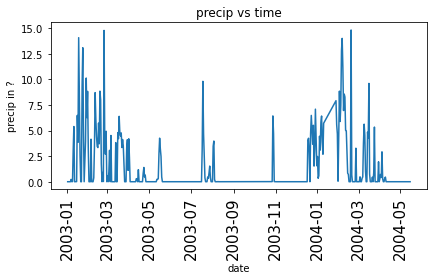

In [20]:
# Function that plots a time series of a specific variable (flux, temp, precip) from a station.

def plot_one_timeserie(cod_station, variable, min_date, max_date):
    
    # Apply the constraints
    
    df_basin = df_flux[ df_flux['basin_id'] == cod_station ]
    df_basin_dates = df_basin[(df_basin['date'] > min_date) & (df_basin['date'] <= max_date)]

    # Plot

    plt.plot(df_basin_dates['date'], df_basin_dates[variable])

    # Labelling 

    plt.xlabel("date")
    plt.ylabel( variable + " in ?")
    plt.title(variable + " vs time")

    # Format
    plt.tick_params(axis='x',labelsize=15,rotation=90)
    plt.tight_layout()

    # Display

    plt.show()

    
# Example of use

cod_station = 1001001
# flux temp_max precip
variable = 'precip'
min_date = "2003-01-01"
max_date = "2004-05-15"

plot_one_timeserie(cod_station, variable, min_date, max_date)


# 3.b

/tmp/ipykernel_112277/2777127604.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



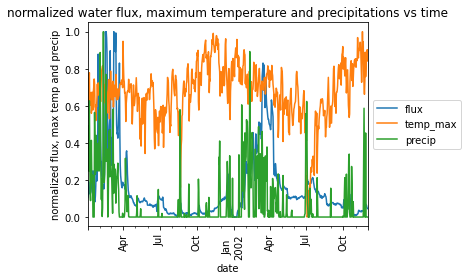

In [21]:
from sklearn import preprocessing

def plot_three_timeseries(cod_station, min_date, max_date):

    # Apply the constraints

    df_basin = df_flux[ df_flux['basin_id'] == cod_station ]
    df_basin_dates = df_basin[(df_basin['date'] > min_date) & (df_basin['date'] <= max_date)]


    # Normalizing variables so they show in the same scale in the plot

    cols = df_basin_dates.values.tolist()
    # Other scalers could be chosen, but I chose this one because of its simplicity
    min_max_scaler = preprocessing.MinMaxScaler()
    df_basin_dates[['flux', 'temp_max', 'precip']] = min_max_scaler.fit_transform(df_basin_dates[['flux', 'temp_max', 'precip']])

    # Plot

    df_basin_dates.plot(x = 'date', y = ['flux', 'temp_max', 'precip'])

    # Labelling 

    plt.xlabel("date")
    plt.ylabel( "normalized flux, max temp and precip")
    plt.title("normalized water flux, maximum temperature and precipitations vs time")

    # Format
    plt.tick_params(axis='x', rotation=90)
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.tight_layout()

    # Display

    plt.show()

# Example of use

cod_station = 1001001
min_date = "2001-01-01"
max_date = "2002-12-1"

plot_three_timeseries(cod_station, min_date, max_date)

# 4

In [22]:
df_flux_cp = df_flux

# Add a field that specifies the season to which the date corresponds to
bins = [0, 91, 183, 275, 366]
labels=['Summer', 'Fall', 'Winter', 'Spring']
doy = df_flux_cp['date'].dt.dayofyear
df_flux_cp['season'] = pd.cut(doy + 11 - 366*(doy > 355), bins=bins, labels=labels)

# Add a field that specifies the year to which the date corresponds to
df_flux_cp['year'] = df_flux_cp['date'].dt.year

# 95th percentile for each season, year and station 
percentiles_95 = df_flux_cp.groupby(['basin_id','season','year'],as_index=False).quantile(.95)

# Merge the dfs by season and year 
df_merged = pd.merge(df_flux_cp, percentiles_95[['basin_id', 'season', 'year', 'flux', 'temp_max', 'precip']], on=['basin_id', 'season', 'year'], how='inner')

# rename columns so we keep the original variables and add names to the calculated percentiles
df_merged.rename(columns = {'flux_x':'flux', 'temp_max_x':'temp_max', 'precip_x':'precip', 'flux_y':'flux_p95', 'temp_max_y':'temp_max_p95', 'precip_y':'precip_p95'}, inplace = True)

df_merged['flux_extreme'] = np.where(df_merged.flux > df_merged.flux_p95, 1, 0)
df_merged['temp_extreme'] = np.where(df_merged.temp_max > df_merged.temp_max_p95, 1, 0)
df_merged['precip_extreme'] = np.where(df_merged.precip > df_merged.precip_p95, 1, 0)

df_flux['flux_extreme'] = df_merged['flux_extreme']
df_flux['temp_extreme'] = df_merged['temp_extreme']
df_flux['precip_extreme'] = df_merged['precip_extreme']

#percentiles_95.head()
#df_merged[df_merged['temp_extreme'] == 1].head(-10)

/tmp/ipykernel_112277/2965772945.py:13: FutureWarning:

Dropping invalid columns in DataFrameGroupBy.quantile is deprecated. In a future version, a TypeError will be raised. Before calling .quantile, select only columns which should be valid for the function.



# 5

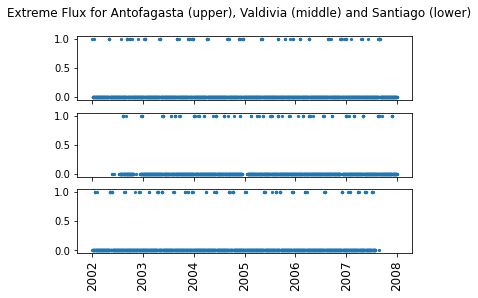

In [23]:
# Near Antofagasta cod_station
Afta_cod_station = 2112006

# Near Valdivia cod_station
Vald_cod_station = 10142003

# Near Santiago cod_station
Sant_cod_station = 5414001


# flux temp_max precip
variable = 'flux_extreme'
min_date = "2002-01-02"
max_date = "2007-12-31"

fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, ncols=1, sharex=True)
fig.suptitle('Extreme Flux for Antofagasta (upper), Valdivia (middle) and Santiago (lower)')

df_Afta = df_flux[ df_flux['basin_id'] == Afta_cod_station ]
df_Afta_dates = df_Afta[(df_Afta['date'] > min_date) & (df_Afta['date'] <= max_date)]
ax1.scatter(df_Afta_dates['date'], df_Afta_dates[variable], s=5)

df_Vald = df_flux[ df_flux['basin_id'] == Vald_cod_station ]
df_Vald_dates = df_Vald[(df_Vald['date'] > min_date) & (df_Vald['date'] <= max_date)]
ax2.scatter(df_Vald_dates['date'], df_Vald_dates[variable], s=5)

df_Sant = df_flux[ df_flux['basin_id'] == Sant_cod_station ]
df_Sant_dates = df_Sant[(df_Sant['date'] > min_date) & (df_Sant['date'] <= max_date)]
ax3.scatter(df_Sant_dates['date'], df_Sant_dates[variable], s=5)
ax3.tick_params(axis='x',labelsize=12,rotation=90)


### Yearly count

#### Antofagasta

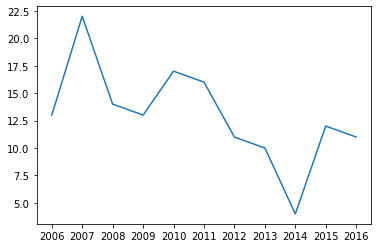

In [24]:
ser_Afta = df_Afta.resample('Y', on='date')['flux_extreme'].sum()
df_Afta_resamp = pd.DataFrame(ser_Afta).reset_index()
df_Afta_resamp.columns = ['date', 'ext_flux_count']

min_date = "2005-01-02"
max_date = "2021-12-31"

df_Afta_dates_r = df_Afta_resamp[(df_Afta_resamp['date'] > min_date) & (df_Afta_resamp['date'] <= max_date)]
plt.plot(df_Afta_dates_r['date'], df_Afta_dates_r['ext_flux_count'])

#### Valdivia

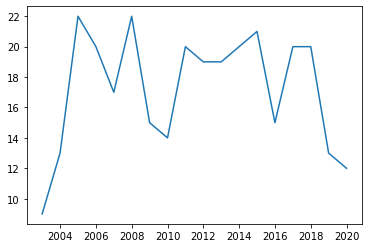

In [25]:
ser_Vald = df_Vald.resample('Y', on='date')['flux_extreme'].sum()
df_Vald_resamp = pd.DataFrame(ser_Vald).reset_index()
df_Vald_resamp.columns = ['date', 'ext_flux_count']

min_date = "1980-01-02"
max_date = "2021-12-31"

df_Vald_dates_r = df_Vald_resamp[(df_Vald_resamp['date'] > min_date) & (df_Vald_resamp['date'] <= max_date)]
plt.plot(df_Vald_dates_r['date'], df_Vald_dates_r['ext_flux_count'])

#### Santiago

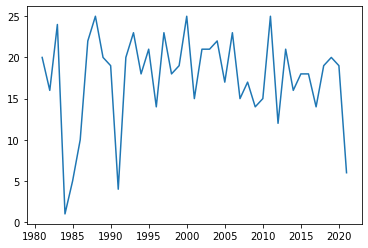

In [26]:
ser_Sant = df_Sant.resample('Y', on='date')['flux_extreme'].sum()
df_Sant_resamp = pd.DataFrame(ser_Sant).reset_index()
df_Sant_resamp.columns = ['date', 'ext_flux_count']

min_date = "1980-01-02"
max_date = "2021-12-31"

df_Sant_dates_r = df_Sant_resamp[(df_Sant_resamp['date'] > min_date) & (df_Sant_resamp['date'] <= max_date)]
plt.plot(df_Sant_dates_r['date'], df_Sant_dates_r['ext_flux_count'])

# 6

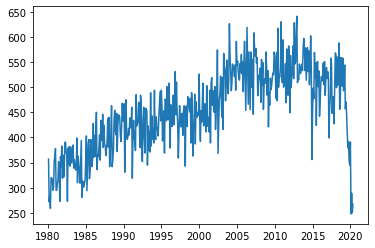

In [27]:
# Monthly between 1980 and 2020

ser_all = df_flux.resample('M', on='date')['flux_extreme'].sum()
df_all_resamp = pd.DataFrame(ser_all).reset_index()
df_all_resamp.columns = ['date', 'ext_flux_count']

min_date = "1980-01-02"
max_date = "2020-05-27"

df_all_dates_r = df_all_resamp[(df_all_resamp['date'] > min_date) & (df_all_resamp['date'] <= max_date)]
plt.plot(df_all_dates_r['date'], df_all_dates_r['ext_flux_count'])

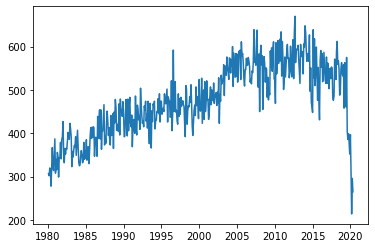

In [28]:
# Monthly between 1980 and 2020

ser_all = df_flux.resample('M', on='date')['temp_extreme'].sum()
df_all_resamp = pd.DataFrame(ser_all).reset_index()
df_all_resamp.columns = ['date', 'ext_temp_count']

min_date = "1980-01-02"
max_date = "2020-05-27"

df_all_dates_r = df_all_resamp[(df_all_resamp['date'] > min_date) & (df_all_resamp['date'] <= max_date)]
plt.plot(df_all_dates_r['date'], df_all_dates_r['ext_temp_count'])

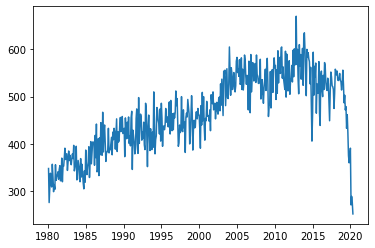

In [29]:
# Monthly between 1980 and 2020

ser_all = df_flux.resample('M', on='date')['precip_extreme'].sum()
df_all_resamp = pd.DataFrame(ser_all).reset_index()
df_all_resamp.columns = ['date', 'ext_precip_count']

min_date = "1980-01-02"
max_date = "2020-05-27"

df_all_dates_r = df_all_resamp[(df_all_resamp['date'] > min_date) & (df_all_resamp['date'] <= max_date)]
plt.plot(df_all_dates_r['date'], df_all_dates_r['ext_precip_count'])

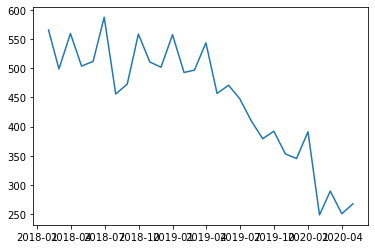

In [30]:
ser_all = df_flux.resample('M', on='date')['flux_extreme'].sum()
df_all_resamp = pd.DataFrame(ser_all).reset_index()
df_all_resamp.columns = ['date', 'ext_flux_count']

min_date = "2018-01-02"
max_date = "2021-12-31"

df_all_dates_r = df_all_resamp[(df_all_resamp['date'] > min_date) & (df_all_resamp['date'] <= max_date)]
plt.plot(df_all_dates_r['date'], df_all_dates_r['ext_flux_count'])

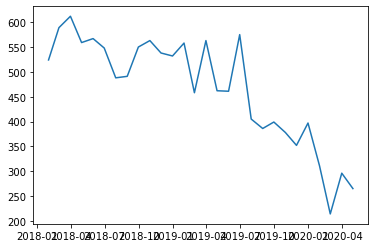

In [31]:
ser_all = df_flux.resample('M', on='date')['temp_extreme'].sum()
df_all_resamp = pd.DataFrame(ser_all).reset_index()
df_all_resamp.columns = ['date', 'ext_temp_count']

min_date = "2018-01-02"
max_date = "2021-12-31"

df_all_dates_r = df_all_resamp[(df_all_resamp['date'] > min_date) & (df_all_resamp['date'] <= max_date)]
plt.plot(df_all_dates_r['date'], df_all_dates_r['ext_temp_count'])

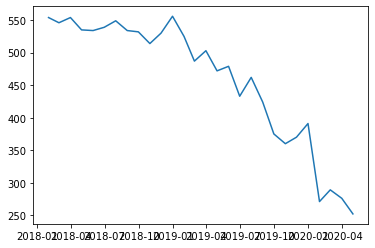

In [32]:
ser_all = df_flux.resample('M', on='date')['precip_extreme'].sum()
df_all_resamp = pd.DataFrame(ser_all).reset_index()
df_all_resamp.columns = ['date', 'ext_precip_count']

min_date = "2018-01-02"
max_date = "2021-12-31"

df_all_dates_r = df_all_resamp[(df_all_resamp['date'] > min_date) & (df_all_resamp['date'] <= max_date)]
plt.plot(df_all_dates_r['date'], df_all_dates_r['ext_precip_count'])

#### <span style="color:red">Extreme events are in decrease since 2019</span>

### Mean variables

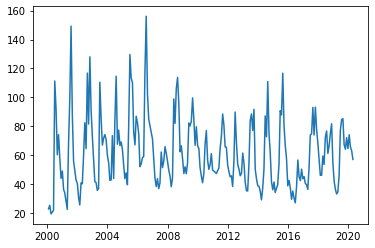

In [33]:
# Meant flux monthly between 1980 and 2020

ser_all = df_flux.resample('M', on='date')['flux'].mean()
df_all_resamp = pd.DataFrame(ser_all).reset_index()
df_all_resamp.columns = ['date', 'mean_flux_monthly']

min_date = "2000-01-02"
max_date = "2020-05-27"

df_all_dates_r = df_all_resamp[(df_all_resamp['date'] > min_date) & (df_all_resamp['date'] <= max_date)]
plt.plot(df_all_dates_r['date'], df_all_dates_r['mean_flux_monthly'])

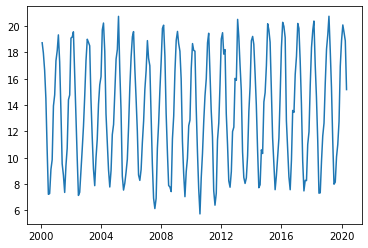

In [34]:
# Monthly between 1980 and 2020

ser_all = df_flux.resample('M', on='date')['temp_max'].mean()
df_all_resamp = pd.DataFrame(ser_all).reset_index()
df_all_resamp.columns = ['date', 'mean_temp_monthly']

min_date = "2000-01-02"
max_date = "2020-05-27"

df_all_dates_r = df_all_resamp[(df_all_resamp['date'] > min_date) & (df_all_resamp['date'] <= max_date)]
plt.plot(df_all_dates_r['date'], df_all_dates_r['mean_temp_monthly'])

In [ ]:
# Monthly between 1980 and 2020

ser_all = df_flux.resample('M', on='date')['precip'].mean()
df_all_resamp = pd.DataFrame(ser_all).reset_index()
df_all_resamp.columns = ['date', 'mean_precip_monthly']

min_date = "2000-01-02"
max_date = "2020-05-27"

df_all_dates_r = df_all_resamp[(df_all_resamp['date'] > min_date) & (df_all_resamp['date'] <= max_date)]
plt.plot(df_all_dates_r['date'], df_all_dates_r['mean_precip_monthly'])

# 7

In [ ]:
# from statsmodels.tsa.stattools import adfuller
# from numpy import log
# result = adfuller(df_flux.flux_extreme)
# print('ADF Statistic: %f' % result[0])
# print('p-value: %f' % result[1])

I was trying to do an ARIMA model but the Notebook kept crashing (probably because it's too much data). I wanted to also try SARIMAX but the problem is that I don't have much time and I need to study a bit more about them, since it's been a while since I've used them. So I propose to use these models, but I would need more time to implement and study. I'm sorry I didn't get any further. Thank you 😊